In [1]:
import os
import csv, json, pickle
from itertools import combinations, product
from functools import wraps
from collections import defaultdict
import bisect

from Bio import SeqIO

import numpy as np
import statsmodels.stats.multitest as ssm
import scipy.stats as stats
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import roc_curve, roc_auc_score

%matplotlib inline
import matplotlib.gridspec as gridspec
from matplotlib.gridspec import GridSpec
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.gridspec as gs
import seaborn as sns
from matplotlib.lines import Line2D
import matplotlib.ticker as ticker
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

sns.set_style("white")

plt.rcParams['font.size'] = 13
plt.rcParams['font.family'] = 'Calibri'
plt.rcParams['font.weight'] = 'normal'
plt.rcParams['axes.linewidth'] = 1
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18
plt.rcParams['legend.fontsize'] = 18
plt.rcParams['legend.handlelength'] = 1.3

plt.rcParams['axes.edgecolor'] = 'k'
plt.rcParams['xtick.color'] = 'k'
plt.rcParams['ytick.color'] = 'k'

plt.rcParams['lines.dashed_pattern'] = (2.8,2.8)

plt.rcParams['svg.fonttype'] = 'none'


blue = "#007EEA"
orange = "#FEB80A"
green = "#7FD13B"
pink = "#EA157A"
white = "#FFFFFF"
purple = "#754AB2"

# General functions for loading, analyzing, and plotting hyperparameter tuning results

Expected directory/file structure/names:
- `hsmid` All HSM/ID training
    - `<PBD_family>` Training for a specific PBD family
        - `fold<i>` Training using the *i*th fold data split as validation
- `hsmd` All HSM/D training
    - `rand_round1` Round 1 random hyperparameter search detailed below
        - `fold<i>` Training using the *i*th fold data split as validation
    - `rand_round2` Round 2 random hyperparameter search detailed below
        - `fold<i>` Training using the *i*th fold data split as validation

In [2]:
def find_metadata_json(directory):
    fname = [s for s in os.listdir(directory) if s.endswith('metadata.json')][0]
    return fname

def load_metadata(folddir):
    d = json.load(open(os.path.join(folddir, find_metadata_json(folddir))))
    return [x for xs in d['parameters']['costs'] for x in xs], [np.mean(x) for x in d['parameters']['costs']]

In [3]:
def plot_grid_search_results(domain, ref, hyperparamd=None, refx=None, ref2=None,
                             lrmin=-5, lrmax=-3, nfolds=8, flabel='hsmid', nepochs=120):
    fig, axs = plt.subplots(2, 4, constrained_layout=True, figsize=(20,6))
    for fold in range(nfolds):
        if hyperparamd is None:
            label = 'HSM/ID'
            folddir = 'hsmid/%s/fold%i' % (domain, fold)
            fname = os.path.join(folddir, 'grid_search_results.json')
            d = json.load(open(fname))
        else:
            d = hyperparamd[fold]
            label = 'HSM/D'
            
        #nepochs = len(d['auc'])/12*5
        epochs = np.tile(np.arange(5,nepochs+5,5), 12)

        cm = plt.cm.get_cmap('RdYlBu')
        #plt.scatter(d['Lambda Params'], d['auc'], c=epochs,
                    #vmin=5, vmax=nepochs+5, cmap=cm, alpha=0.7)
        #plt.colorbar(label="Epoch")
        ix = int(fold/4)
        iy = fold % 4

        im = axs[ix, iy].scatter(d['Lambda Params'], d['auc'], c=np.log10(d['Learning Rate']),
                    vmin=lrmin, vmax=lrmax, cmap=cm, alpha=0.7)
        
        #plt.colorbar(label="log Learning Rate")
        if ix == 1: axs[ix,iy].set_xlabel("L1 Regularization", fontsize=15)
        if iy == 0: axs[ix,iy].set_ylabel("AUROC", fontsize=15)
        
        axs[ix, iy].set_title('%s %s fold %i' % (label, domain, fold+1), fontsize=15)
        axs[ix,iy].set_xscale('log')
        if ref != 0: axs[ix, iy].hlines(ref, xmin=min(d['Lambda Params']), xmax=max(d['Lambda Params']), color='black')
        if ref2 is not None: axs[ix, iy].hlines(ref2, xmin=min(d['Lambda Params']), xmax=max(d['Lambda Params']), color='purple', linestyle='dashed')
        if refx is not None: axs[ix, iy].vlines(refx, ymin=min(d['auc']), ymax=max(d['auc']), color='black')
    
    cbar = fig.colorbar(im, ax=axs.ravel().tolist(), label="log Learning Rate", ticks=np.arange(lrmin, lrmax+1, dtype=int))
    
    of = os.path.join(output_directory, '%s_%s_hyperparam_search_results.jpg' % (flabel, domain))
    fig.savefig(of, dpi=500, transparent=True, bbox_inches='tight')

In [4]:
def plot_grid_search_results_per_epoch(domain, ref, hyperparamd=None, ref2=None, lrmin=-5, lrmax=-3,
                                       ntrials=20, nepochs=120, nfolds=8, flabel='hsmid'):
    fig, axs = plt.subplots(2, 4, constrained_layout=True, figsize=(20,6))
    for fold in range(nfolds):
        if hyperparamd is None:
            label = 'HSM/ID'
            folddir = 'hsmid/%s/fold%i' % (domain, fold)
            fname = os.path.join(folddir, 'grid_search_results.json')
            d = json.load(open(fname))
        else:
            d = hyperparamd[fold]
            label = 'HSM/D'
            
        epochs = np.tile(np.arange(5,nepochs+5,5), ntrials)

        cm = plt.cm.get_cmap('RdYlBu')
        ix = int(fold/4)
        iy = fold % 4

        im = axs[ix, iy].scatter(epochs, d['auc'], c=np.log10(d['Learning Rate']),
                    vmin=lrmin, vmax=lrmax, cmap=cm, alpha=0.7)
        
        #plt.colorbar(label="log Learning Rate")
        if ix == 1: axs[ix,iy].set_xlabel("Epoch", fontsize=15)
        if iy == 0: axs[ix,iy].set_ylabel("AUROC", fontsize=15)
        
        axs[ix, iy].set_title('%s %s fold %i' % (label, domain, fold+1), fontsize=15)
        if ref != 0: axs[ix, iy].hlines(ref, xmin=0, xmax=nepochs, color='black')
        if ref2 is not None: axs[ix, iy].hlines(ref2, xmin=0, xmax=nepochs, color='purple', linestyle='dashed')
  
    cbar = fig.colorbar(im, ax=axs.ravel().tolist(), label="log Learning Rate", ticks=np.arange(lrmin, lrmax+1, dtype=int))
    
    of = os.path.join(output_directory, '%s_%s_hyperparam_search_results_per_epoch.jpg' % (flabel, domain))
    fig.savefig(of, dpi=500, transparent=True, bbox_inches='tight')

In [5]:
def plot_opt_hsmd_vs_individual(dom, grid_results, lambdas, aucs, opt_per_fold, ref,
                                lrmin=-5, lrmax=-3, nepochs=120, nfolds=8, flabel='hsmd_round1'):
    optid = []
    optd = []
    optid_auc = []
    optd_auc = []
    optid_lr = []
    optd_lr = []
    optid_epoch = []
    optd_epoch = []
    for fold in range(nfolds):
        #print('Fold %i' % fold)
        ndx = np.argmax(grid_results[dom][fold]['auc'])
        optid_auc.append(grid_results[dom][fold]['auc'][ndx])
        optid.append(grid_results[dom][fold]['Lambda Params'][ndx])
        #print('Optimal Lambda Param %10g' %  optid[-1])
        optid_lr.append(grid_results[dom][fold]['Learning Rate'][ndx])
        optid_epoch.append(grid_results[dom][fold]['Epochs'][ndx])
        optd.append(lambdas[fold][dom])
        optd_auc.append(aucs[fold][dom])
        optd_lr.append(opt_per_fold[fold]['Learning Rate'])
        optd_epoch.append(opt_per_fold[fold]['Epochs'])
    print('average optimal hyperparameters considering only domain AUC:')
    logl1 = np.log10(optid)
    print(   'Lambda param:  %10g, std in logspace: %10g, max diff in logspace: %10g'
          % (np.mean(optid), np.std(logl1), np.max(np.abs(logl1 - np.mean(logl1)))))
    
    fig, axs = plt.subplots(1, 4, constrained_layout=True, figsize=(20,5))
    cm = plt.cm.get_cmap('Spectral')
    axs[0].scatter(optid, optd, c=np.arange(1, nfolds+1), cmap=cm, s=100)
    axs[0].plot([1e-8, 1e-3],[1e-8, 1e-3], ls='--', c='#696969', lw=2.5)
    axs[0].set_ylabel('Optimal L1 regularization based on av domain AUCs')
    axs[0].set_xlabel('Optimal L1 regularization based on domain AUC')
    axs[0].set_title('%s' % dom, fontsize=15)
    axs[0].set_aspect('equal', adjustable='box')
    axs[0].set_xlim([1e-8, 1e-3])
    axs[0].set_ylim([1e-8, 1e-3])
    axs[0].set_xscale('log')
    axs[0].set_yscale('log')
    
    axs[1].scatter(optid_lr, optd_lr, c=np.arange(1, nfolds+1), cmap=cm, s=100)
    axs[1].plot([10**lrmin, 10**lrmax], [10**lrmin, 10**lrmax], ls='--', c='#696969', lw=2.5)
    axs[1].set_ylabel('Optimal learning rate based on av domain AUCs')
    axs[1].set_xlabel('Optimal learnign rate based on domain AUC')
    axs[1].set_title('%s' % dom, fontsize=15)
    axs[1].set_aspect('equal', adjustable='box')
    axs[1].set_xlim([10**lrmin, 10**lrmax])
    axs[1].set_ylim([10**lrmin, 10**lrmax])
    axs[1].set_xscale('log')
    axs[1].set_yscale('log')
    
    axs[2].scatter(optid_epoch, optd_epoch, c=np.arange(1, nfolds+1), cmap=cm, s=100)
    axs[2].plot([5, nepochs+5],[5, nepochs+5], ls='--', c='#696969', lw=2.5)
    axs[2].set_ylabel('Optimal # epochs based on av domain AUCs')
    axs[2].set_xlabel('Optimal # epochs based on domain AUC')
    axs[2].set_title('%s' % dom, fontsize=15)
    axs[2].set_aspect('equal', adjustable='box')
    axs[2].set_xlim([5, nepochs+5])
    axs[2].set_ylim([5, nepochs+5])
    
    axs[3].scatter(optid_auc, optd_auc, c=np.arange(1, nfolds+1), cmap=cm, s=100)
    axs[3].plot([0,1],[0,1], ls='--', c='#696969', lw=2.5)
    axs[3].set_ylabel('AUC with params based on av domain AUCs')
    axs[3].set_xlabel('AUC with params based on domain AUC')
    axs[3].set_title('%s' % dom)
    axs[3].set_aspect('equal', adjustable='box')
    xmin = np.min([optid_auc, optd_auc])-0.02
    xmax = np.max([optid_auc, optd_auc])+0.02
    axs[3].set_xlim([xmin, xmax])
    axs[3].set_ylim([xmin, xmax])
    axs[3].hlines(ref, xmin=xmin, xmax=1, color='purple', linestyle='dashed')
    axs[3].vlines(ref, ymin=xmin, ymax=1, color='purple', linestyle='dashed')
    
    of = os.path.join(output_directory, '%s_%s_opt_per_domain_vs_opt_hsmd.jpg' % (flabel, dom))
    fig.savefig(of, dpi=500, transparent=True, bbox_inches='tight')
    
    return np.mean(optid)

In [6]:
def get_optimal_av(domain, nfolds=8):
    lr = []
    l1 = []
    epochs = []
    for fold in range(nfolds):
        folddir = 'hsmid/%s/fold%i' % (domain, fold)
        fname = os.path.join(folddir, 'optimal_hyperparameters.json')
        d = json.load(open(fname))
        lr.append(d['Learning Rate'])
        l1.append(d['Lambda Params'])
        epochs.append(d['Epochs'])
        
    print('\n %s' % domain)
    print('average optimal hyperparameters:')
    print(   'learning rate: %10g std: %g' % (np.mean(lr), np.std(lr)))
    print(   'Lambda param:  %10g std: %g' % (np.mean(l1), np.std(l1)))
    print(   'Epochs:        %10g std: %g' % (np.mean(epochs), np.std(epochs)))
    
    return domain+':'+str(np.mean(l1))

In [7]:
output_directory = "plots_hyperparam_tuning/"
if not os.path.exists(output_directory): os.makedirs(output_directory)

# HSM/ID Hyperparameter grid search results

For HSM/ID models, a grid search was performed to tune hyperparameters for each fold. Learning rates of 1e-5, 1e-4, 1e-3; regularization parameters of 1e-7, 1e-6, 1e-5, 1e-4; epochs in increments of 5, max of 60 were considered for each fold. `train_foldtune_grid.py` was used.

The following determines the average optimal hyperparameters for each PBD family and plots results of all hyperparameter runs. The optimal HSM/ID regularization parameter for each PBD family was used as reference for HSM/D random hyperparameter search.

findfont: Font family ['Calibri'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Calibri'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Calibri'] not found. Falling back to DejaVu Sans.



 SH2
average optimal hyperparameters:
learning rate:   3.25e-05 std: 3.89711e-05
Lambda param:       1e-05 std: 0
Epochs:              47.5 std: 21.6506

 Kinase_TK
average optimal hyperparameters:
learning rate:   3.25e-05 std: 3.89711e-05
Lambda param:  8.7625e-06 std: 3.27412e-06
Epochs:              47.5 std: 20.3101

 PTP
average optimal hyperparameters:
learning rate:     0.0001 std: 0
Lambda param:      0.0001 std: 0
Epochs:             43.75 std: 10.5327

 SH3
average optimal hyperparameters:
learning rate:    5.5e-05 std: 4.5e-05
Lambda param:   4.375e-06 std: 4.35711e-06
Epochs:            34.375 std: 16.6654

 WW
average optimal hyperparameters:
learning rate:  0.0008875 std: 0.000297647
Lambda param:  8.7625e-05 std: 3.27412e-05
Epochs:             38.75 std: 13.8632

 PDZ
average optimal hyperparameters:
learning rate:     0.0001 std: 0
Lambda param:   4.375e-06 std: 4.35711e-06
Epochs:            36.875 std: 14.777

 WH1
average optimal hyperparameters:
learning rate: 0.

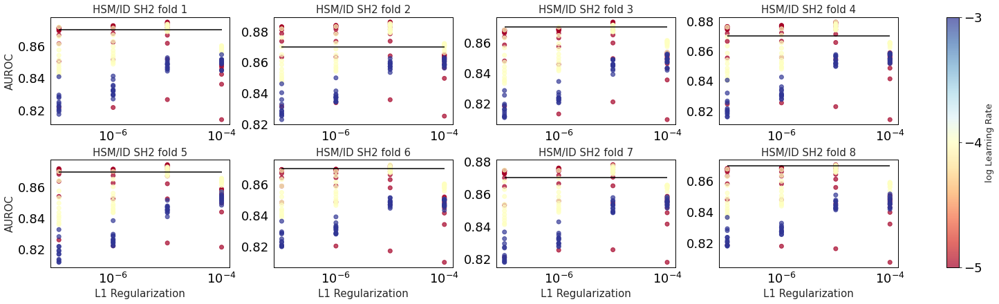

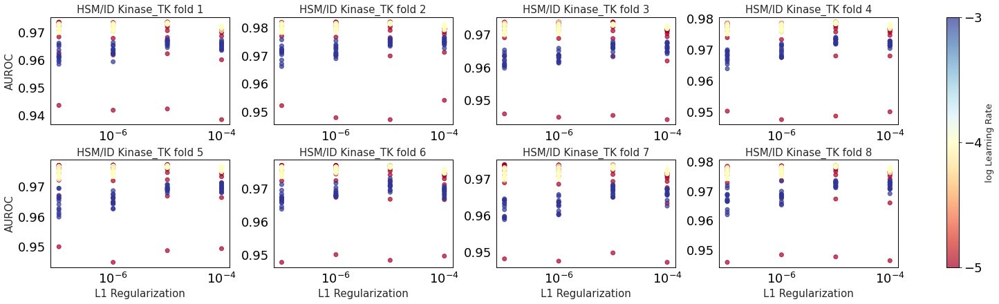

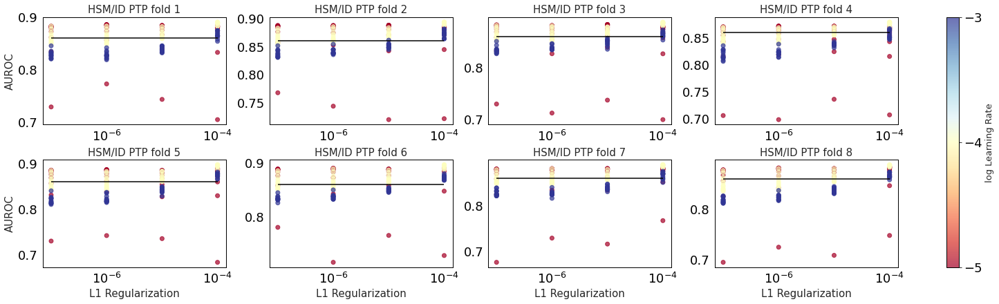

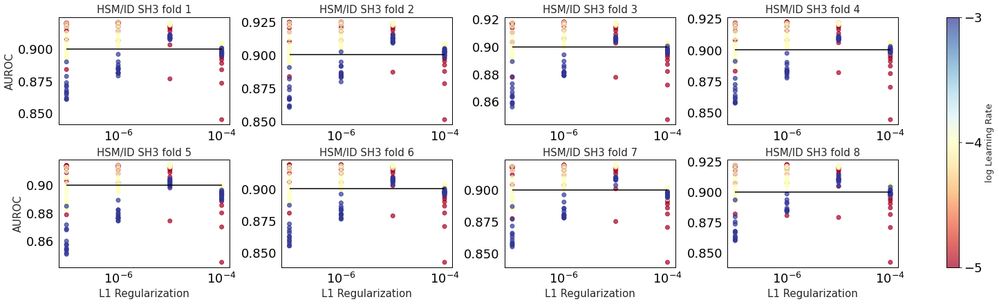

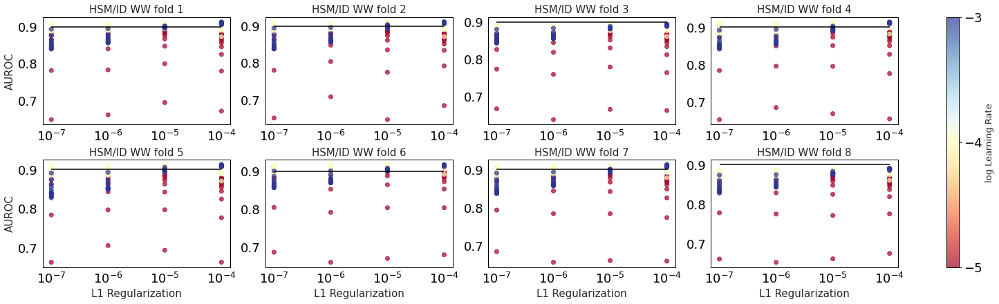

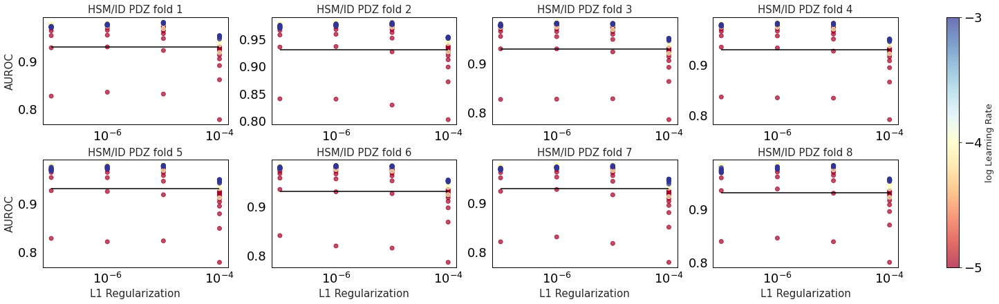

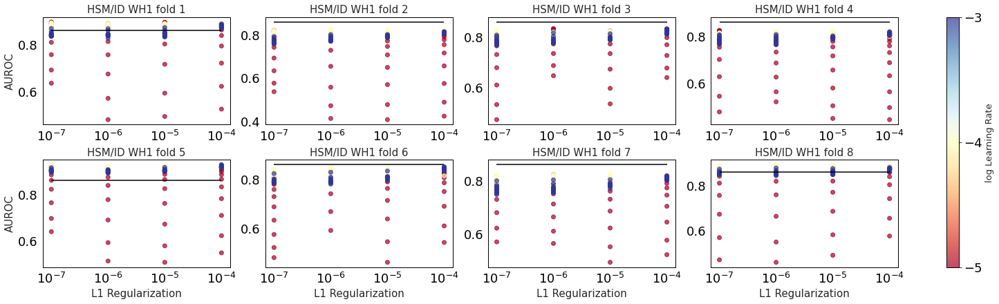

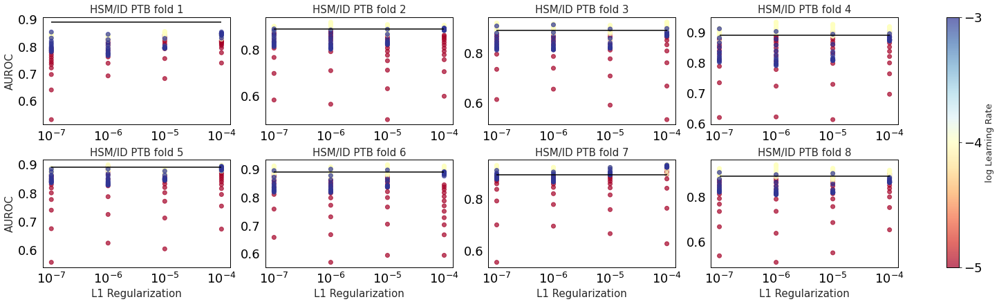

In [8]:
domains = ["SH2", "Kinase_TK", "PTP", "SH3", "WW", "PDZ", "WH1", "PTB"]
# published HSM/ID AUC
refs = [0.87, 0, 0.86, 0.90, 0.90, 0.93, 0.86, 0.89]
nfolds = 8

formatted_optl1 = []
for domain, ref in zip(domains, refs):
    plot_grid_search_results(domain, ref)
    formatted_optl1.append(get_optimal_av(domain))
    
print("Formatted optimal average HSM/ID regularization parameters to use for HSM/D round 1 random search:")
print(' '.join(formatted_optl1))

# HSM/D Hyperparameter grid search results

In [9]:
def output_optimal(d, ndx, fname):
    for k in d.keys():
        print(k, d[k][ndx])
    
    optimal = {k: d[k][ndx] for k in d.keys()}
    #with open(fname, 'w+') as f:
     #   json.dump(optimal, f)
        
    return optimal

def get_hsmd_grid_search_results(fold, basedir, reformat_auc=False):
    fname = os.path.join(basedir, 'fold%i/grid_search_results.json' % fold)
    d = json.load(open(fname))
    if reformat_auc: d['auc'] = [l[i] for l in d['auc'] for i in range(len(l))]
    
    print('\n\nFold %i' % (fold))
    print('Max mean auc hyperparameters:')
    ndx = np.argmax(d['mean auc'])
    fname = 'hsmd/fold%i/optimal_hyperparameters_mean_auc.json' % fold
    optimal_mean = output_optimal(d, ndx, fname)
    
    ndx = np.argmax(d['min auc'])
    print('\nMax min auc hyperparameters:')
    fname = 'hsmd/fold%i/optimal_hyperparameters_min_auc.json' % fold
    optimal_min = output_optimal(d, ndx, fname)
    
    return d, optimal_mean, optimal_min

## Round 1 of random hyperparameter search

50 trials of random hyperparameters (learning rate, regularization parameter, number of epochs) were performed for HSM/D. Learning rate was selected from log uniform distribution ranging from 1e-5 to 1e-3; and regularization parameter for each PBD family was selected from log uniform distribution ranging from -3 orders of magnitude to +1.5 orders of magnitude about optimal HSM/ID value. For all 50 randomly selected hyperparameter combinations of learning rate and regularization parameters per PBD family, models were trained for 120 epochs, results saved every 5 epochs to determine optimal number of epochs. `train_foldtune_rand.py` was used.

The following outputs optimal hyperparameters for each fold based on either (1) AUC averaged over all PBD families or (2) minmum AUC over all PBD families and plots results of all hyperparameter runs.



Fold 0
Max mean auc hyperparameters:
Learning Rate 0.00014847462881489471
Lambda Params SH2:4.063825472398575e-06 Kinase_TK:1.484471439428908e-05 PTP:2.3302744944670557e-05 SH3:7.551781741184593e-09 WW:3.9371291474713487e-07 PDZ:1.0187811571147627e-07 WH1:2.173187611396812e-05 PTB:7.875647681327612e-05
Epochs 80
mean auc 0.9026085415494616
min auc 0.8193240965831979
auc {'SH2_phosphosite': 0.8767993631918385, 'WH1_polyproline': 0.8193240965831979, 'WW_polyproline': 0.9131146905069949, 'PTB_phosphosite': 0.8644865174985658, 'PDZ_c-terminus': 0.9786235769706545, 'Kinase_TK_phosphosite': 0.9699159279585774, 'SH3_polyproline': 0.9238730411390187, 'PTP_phosphosite': 0.8747311185468452}

Max min auc hyperparameters:
Learning Rate 0.0003889351995784631
Lambda Params SH2:2.233089693828433e-08 Kinase_TK:3.474293860531318e-06 PTP:3.015144921495815e-07 SH3:5.536048032880833e-09 WW:2.5370822535995428e-06 PDZ:1.2852652437775898e-07 WH1:3.6980353928066037e-06 PTB:0.0002666274716757699
Epochs 5
mea

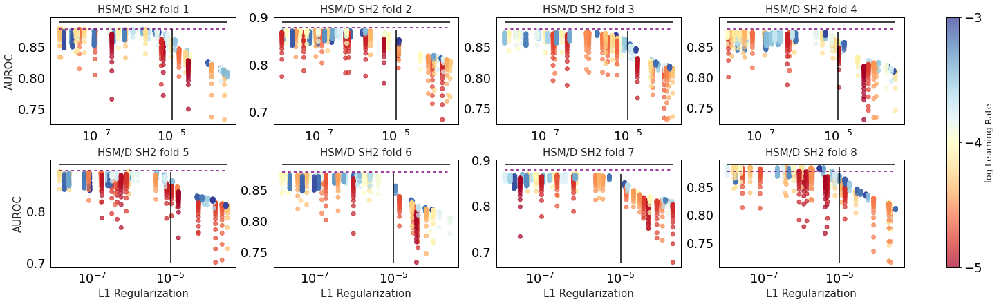

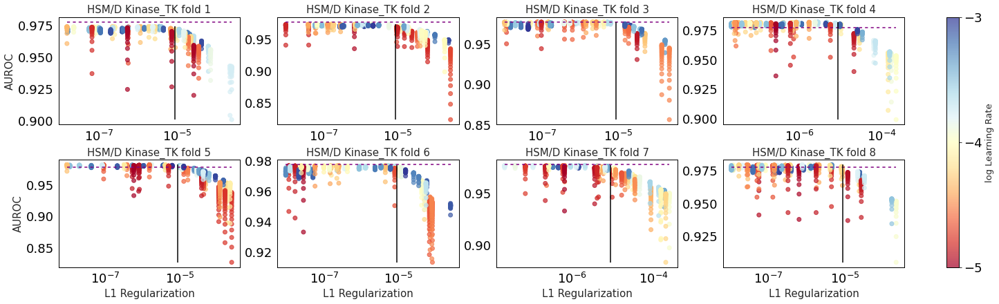

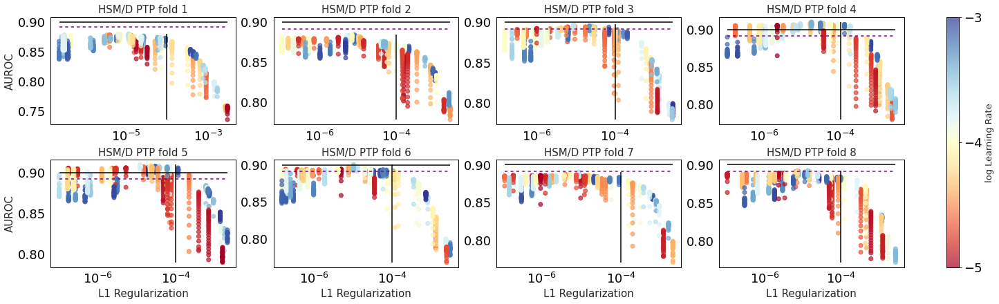

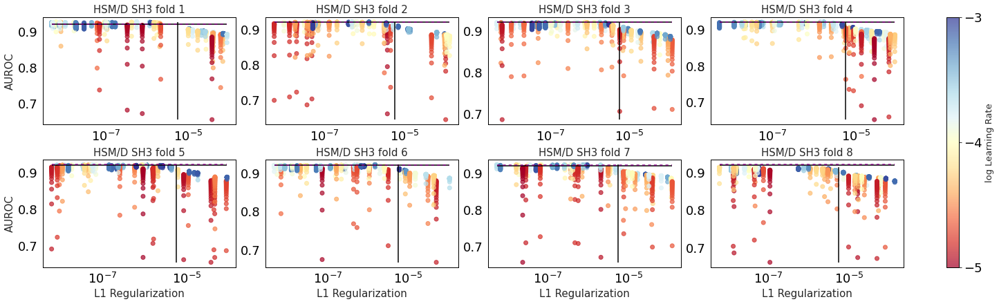

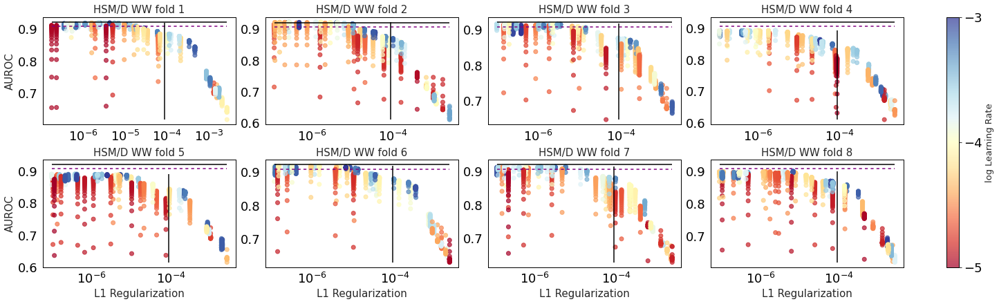

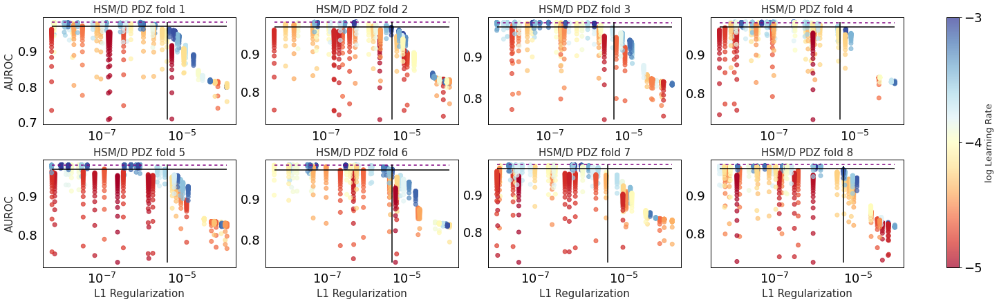

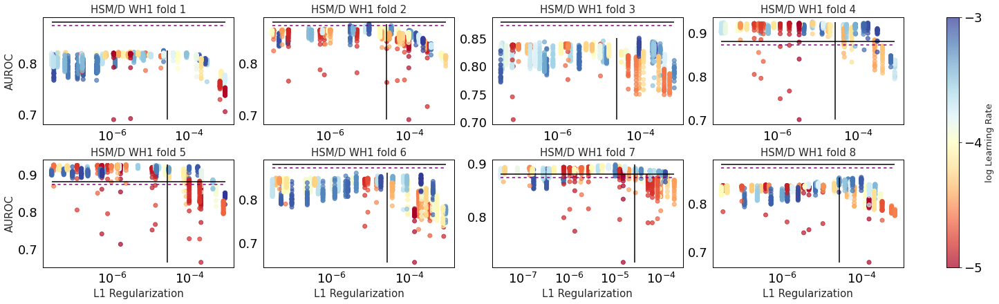

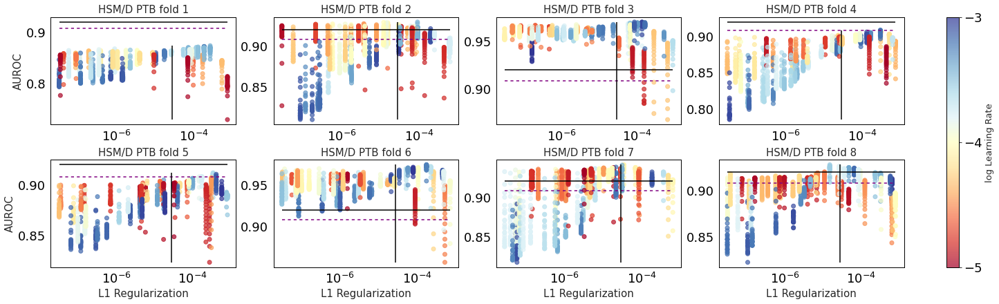

In [10]:
nfolds = 8
grid_results = {dom: [{} for i in range(nfolds)] for dom in domains}
opt_per_fold = []
dom_keys = {}
for i in range(nfolds):
    d, optmean, optmin = get_hsmd_grid_search_results(i, 'hsmd/rand_round1', reformat_auc=False)
    opt_per_fold.append(optmean)
    
    for k in d['auc'][0].keys():
        dom = '_'.join(k.split('_')[:-1])
        dom_keys[dom] = k
        
    lambdas = {dom: [] for dom in domains}
    for ls in d['Lambda Params']:
        for dl in ls.split():
            dom = dl.split(':')[0]
            val = float(dl.split(':')[1])
            lambdas[dom].append(val) 

    for dom in domains:
        for k in d.keys():
            if k == 'Learning Rate' or k == 'Epochs':
                grid_results[dom][i][k] = d[k]
            elif k == 'Lambda Params':
                grid_results[dom][i][k] = lambdas[dom]
            elif k == 'auc':
                grid_results[dom][i]['auc'] = [x[dom_keys[dom]] for x in d[k]]
                

domains = ["SH2", "Kinase_TK", "PTP", "SH3", "WW", "PDZ", "WH1", "PTB"]
# published HSM/D AUC
refs = [0.89, 0, 0.90, 0.92, 0.92, 0.97, 0.88, 0.92]
# new HSM/ID AUC
refsid = [0.878651, 0.977438, 0.891619, 0.920976, 0.907046, 0.981165, 0.873311, 0.908195]
# optimal L1 reg based on HSM/ID grid search, used as reference for random sampling of HSM/D hyperparameters
refs_lambda_hsmid = [1e-05, 8.7625e-06, 0.0001, 5.5e-06, 8.7625e-05, 4.3750000000000005e-06, 2.665e-05, 2.8e-05]

for domain, ref, refx, refid in zip(domains, refs, refs_lambda_hsmid, refsid):
    plot_grid_search_results(domain, ref, hyperparamd=grid_results[domain], refx=refx, ref2=refid, lrmin=-5, lrmax=-3, flabel='hsmd_round1')

The following plots the AUC vs epoch (ie training curve) for all hyperparameter round 1 trials.

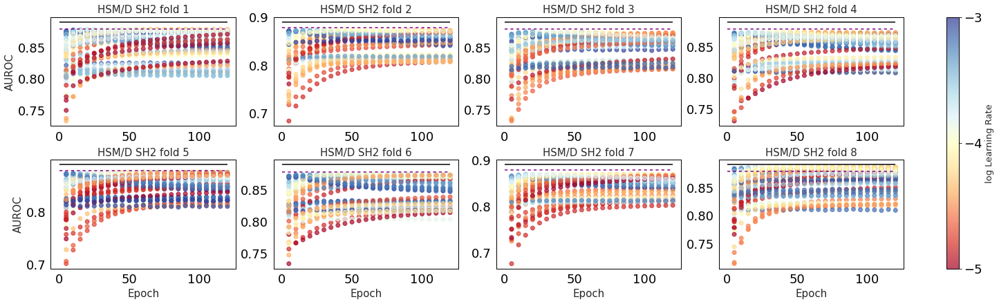

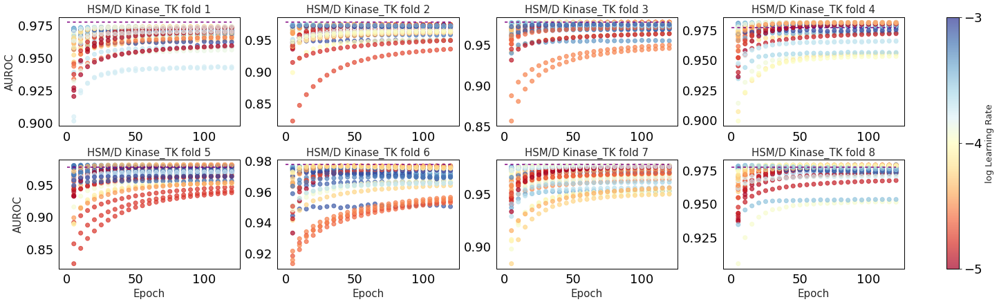

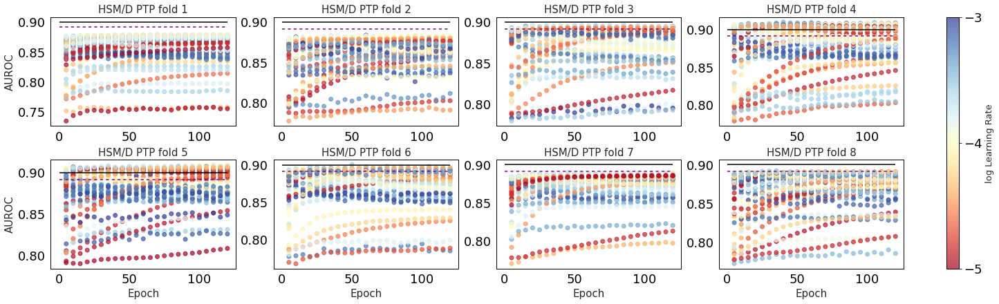

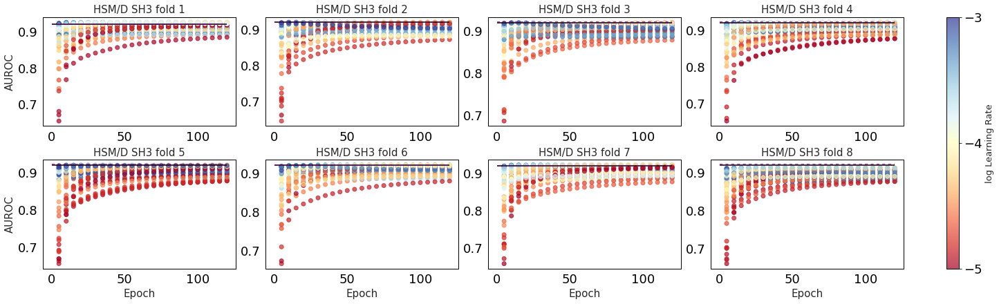

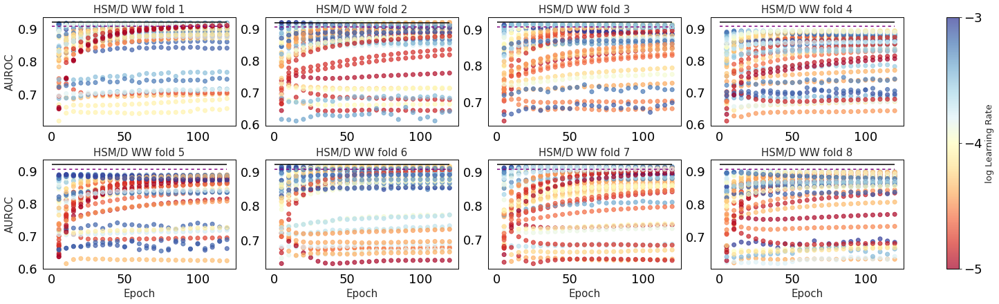

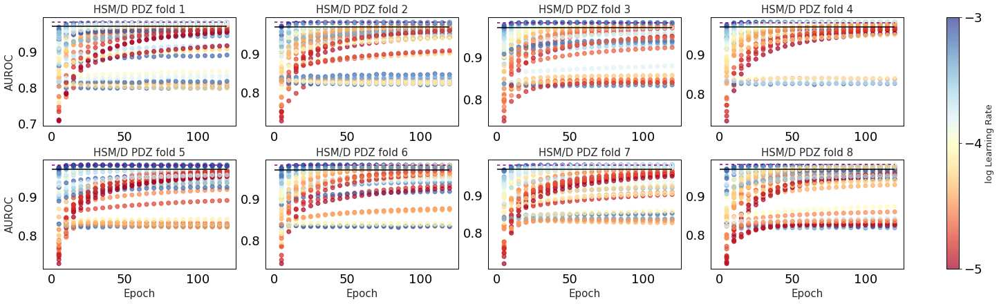

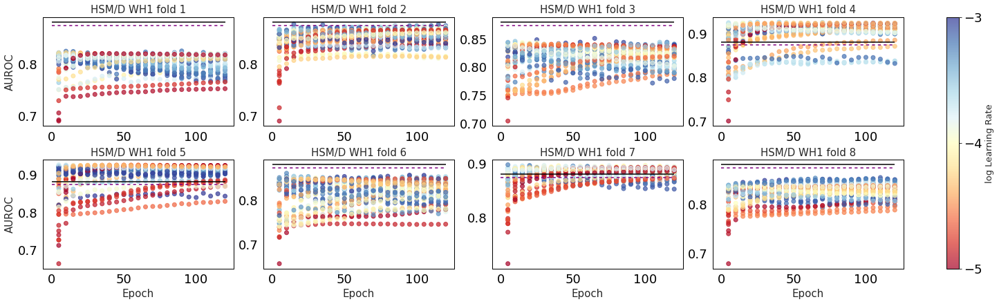

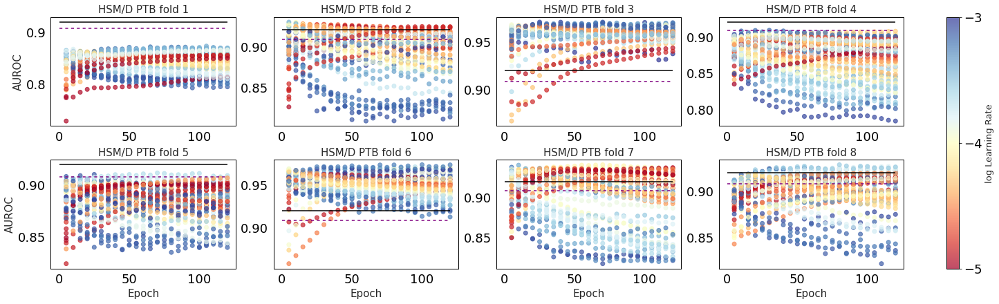

In [11]:
for domain, ref, refid in zip(domains, refs, refsid):
    plot_grid_search_results_per_epoch(domain, ref, hyperparamd=grid_results[domain], ref2=refid,
                                       lrmin=-5, lrmax=-3, ntrials=50, flabel='hsmd_round1')

The following examines the hyperparamter tuning results of round 1 considering what hyperparameters maximize the AUC for each PBD family individually. These optimal "per PBD family" AUCs (and parameter values) are compared to the AUC (and parameter values) when hyperparameters are chosen based on the average AUC of all PBD families.

The regularization parameter that results in the highest AUC for a given PBD family is used as a reference for a second, more focused round of random hyperparameter search for HSM/D.

findfont: Font family ['Calibri'] not found. Falling back to DejaVu Sans.



SH2
average optimal hyperparameters considering only domain AUC:
Lambda param:  5.80156e-07, std in logspace:   0.782173, max diff in logspace:    1.16566

Kinase_TK
average optimal hyperparameters considering only domain AUC:
Lambda param:  3.02538e-06, std in logspace:   0.196336, max diff in logspace:    0.32462

PTP
average optimal hyperparameters considering only domain AUC:
Lambda param:  1.13193e-05, std in logspace:    0.10513, max diff in logspace:   0.200461

SH3
average optimal hyperparameters considering only domain AUC:
Lambda param:  6.9499e-07, std in logspace:   0.412551, max diff in logspace:   0.880347

WW
average optimal hyperparameters considering only domain AUC:
Lambda param:  2.09734e-06, std in logspace:   0.424351, max diff in logspace:   0.737844

PDZ
average optimal hyperparameters considering only domain AUC:
Lambda param:  3.02872e-07, std in logspace:   0.757529, max diff in logspace:    1.30816

WH1
average optimal hyperparameters considering only domain

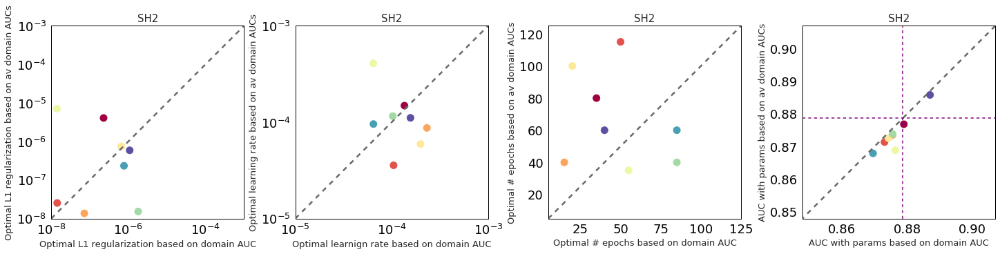

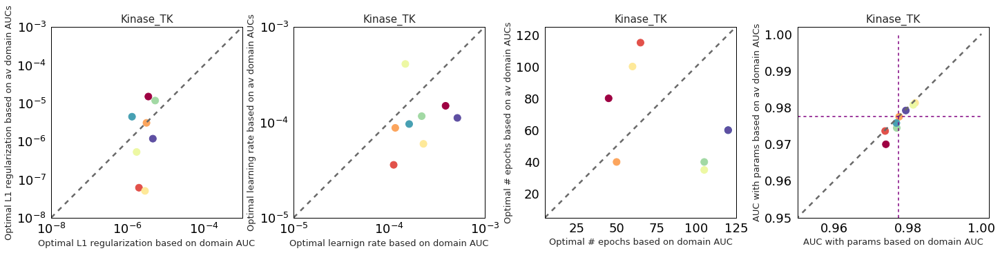

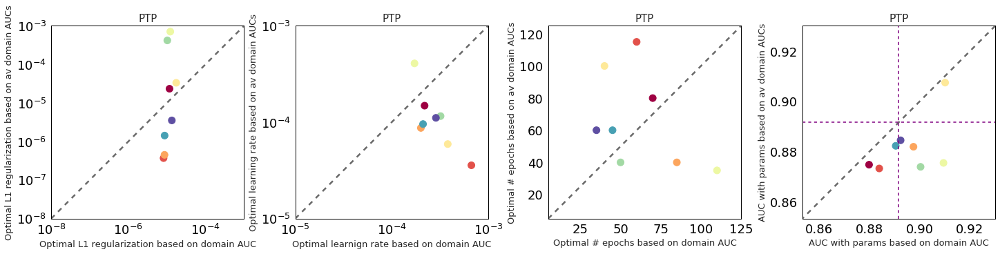

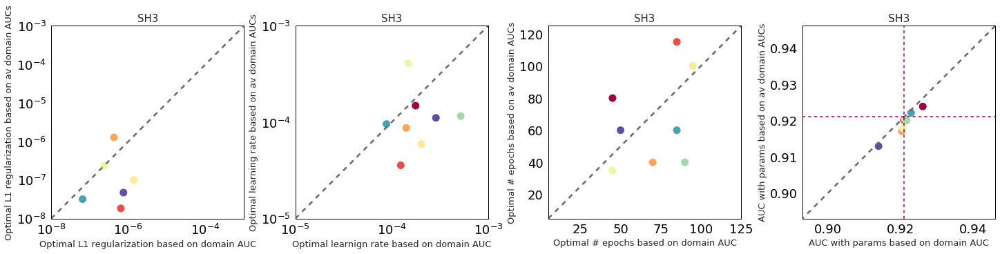

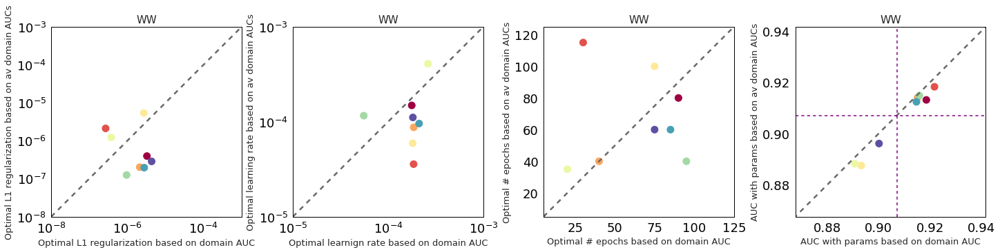

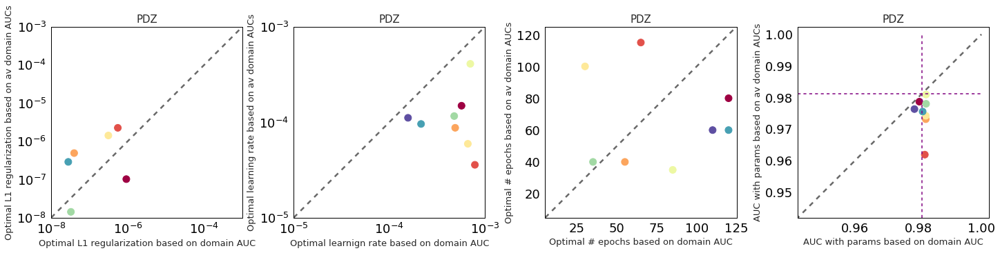

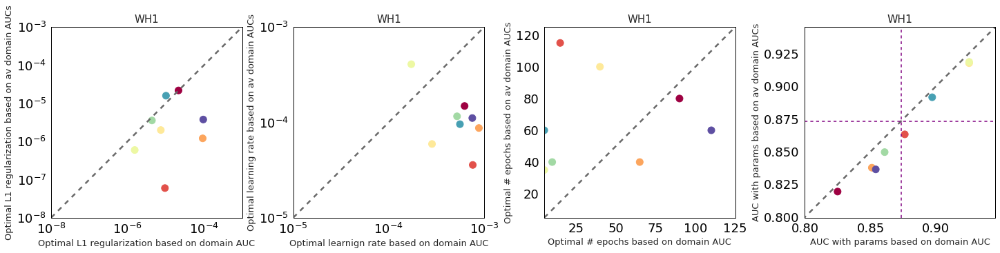

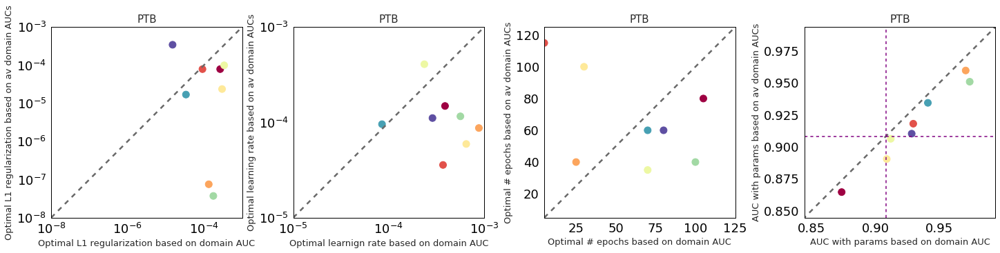

In [12]:
lambdas = [{} for i in range(nfolds)]
aucs = [{} for i in range(nfolds)]
for i in range(nfolds):
    for dl in opt_per_fold[i]['Lambda Params'].split():
        dom = dl.split(':')[0]
        val = float(dl.split(':')[1])
        lambdas[i][dom] = val
        for k, v in opt_per_fold[i]['auc'].items():
            dom = '_'.join(k.split('_')[:-1])
            aucs[i][dom] = v

formatted_optl1 = []
for dom, ref in zip(domains, refsid):
    print('\n%s' % dom)
    formatted_optl1.append('%s:%g' % (dom, plot_opt_hsmd_vs_individual(dom, grid_results, lambdas, aucs, opt_per_fold, ref)))
    
print("\nRegularization values to use as reference for round 2 of random hyperparameter search:")
print(' '.join(formatted_optl1))

# Round 2 of tuning focused around optimal values per domain

30 trials of random hyperparameters (learning rate, regularization parameter, number of epochs) were performed for HSM/D. Learning rate was selected from log uniform distribution ranging from 1e-4.5 to 1e-3; and regularization parameter for each PBD family was selected from log uniform distribution ranging from +/- 0.7 orders of magnitude about optimal value from round 1. For all 30 randomly selected hyperparameter combinations of learning rate and regularization parameters per PBD family, models were trained for 200 epochs, results saved every 5 epochs to determine optimal number of epochs. `train_foldtune_rand.py` was used.

The following analyzes and plots results of round 2.



Fold 0
Max mean auc hyperparameters:
Learning Rate 0.0005753175074557098
Lambda Params SH2:1.110302752107801e-06 Kinase_TK:7.992685402957913e-06 PTP:5.326217442743125e-05 SH3:1.0827156656350856e-06 WW:1.3822097004528061e-06 PDZ:5.541110179326723e-07 WH1:5.81147392072112e-05 PTB:0.00047316812023857967
Epochs 70
mean auc 0.9148204334795207
min auc 0.8669416200372587
auc {'SH2_phosphosite': 0.8669416200372587, 'WH1_polyproline': 0.8735814989495709, 'WW_polyproline': 0.9173877764234721, 'PTB_phosphosite': 0.9154849906794369, 'PDZ_c-terminus': 0.9823087050824358, 'Kinase_TK_phosphosite': 0.9724251538955042, 'SH3_polyproline': 0.919714428855998, 'PTP_phosphosite': 0.8707192939124891}

Max min auc hyperparameters:
Learning Rate 0.00011850426490628634
Lambda Params SH2:1.4926562300168038e-06 Kinase_TK:3.972276328678884e-06 PTP:9.45631756864293e-06 SH3:1.361041196309261e-06 WW:4.247672600989759e-06 PDZ:9.122675325507467e-07 WH1:1.0433299866985355e-05 PTB:6.10077208270607e-05
Epochs 70
mean au


SH2
average optimal hyperparameters considering only domain AUC:
Lambda param:  1.70533e-06, std in logspace:   0.154243, max diff in logspace:   0.376097

Kinase_TK
average optimal hyperparameters considering only domain AUC:
Lambda param:  3.47694e-06, std in logspace:   0.272627, max diff in logspace:   0.666692

PTP
average optimal hyperparameters considering only domain AUC:
Lambda param:  1.17492e-05, std in logspace:    0.08618, max diff in logspace:   0.127772

SH3
average optimal hyperparameters considering only domain AUC:
Lambda param:  1.28615e-06, std in logspace:   0.147476, max diff in logspace:   0.224554

WW
average optimal hyperparameters considering only domain AUC:
Lambda param:  3.04364e-06, std in logspace:   0.294158, max diff in logspace:   0.443018


/var/folders/p9/cnxldg9x2x75bc1nl5r39c7w0000gn/T/ipykernel_70618/1141523657.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 4, constrained_layout=True, figsize=(20,5))



PDZ
average optimal hyperparameters considering only domain AUC:
Lambda param:  2.96061e-07, std in logspace:   0.327681, max diff in logspace:   0.474962

WH1
average optimal hyperparameters considering only domain AUC:
Lambda param:  4.22641e-05, std in logspace:   0.426709, max diff in logspace:    0.56962

PTB
average optimal hyperparameters considering only domain AUC:
Lambda param:  6.04089e-05, std in logspace:   0.217206, max diff in logspace:   0.468187


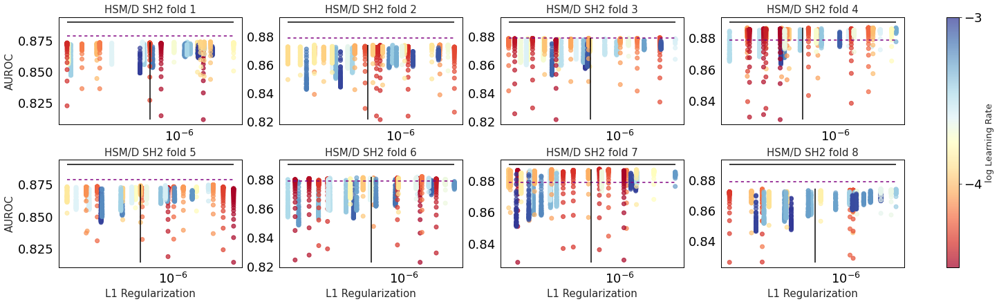

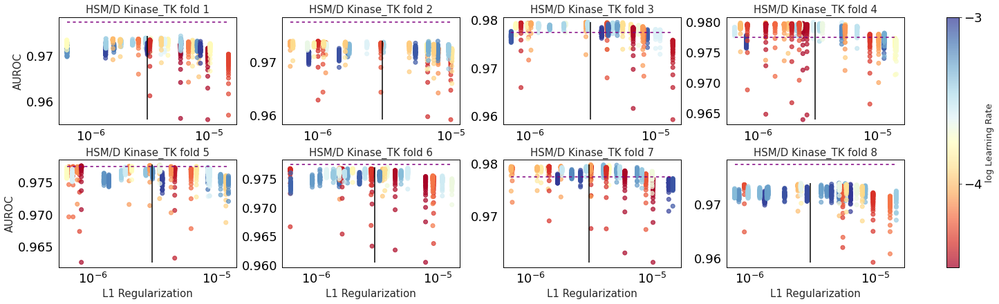

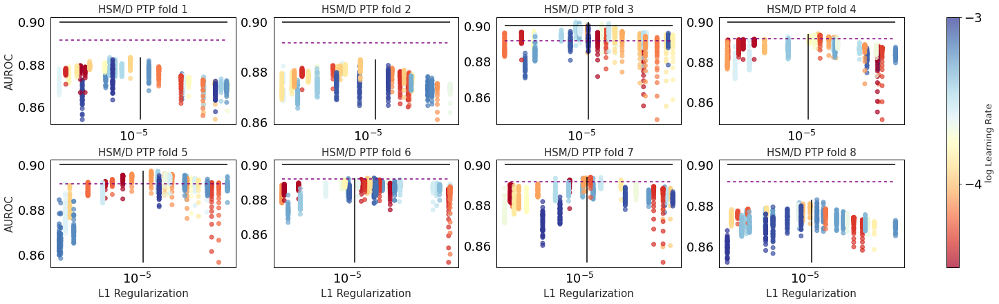

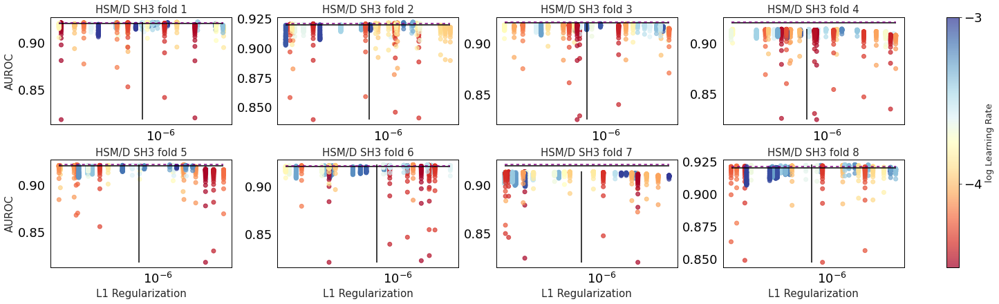

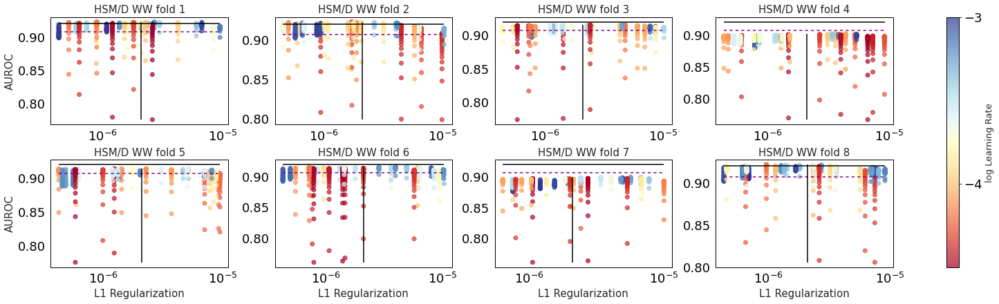

...

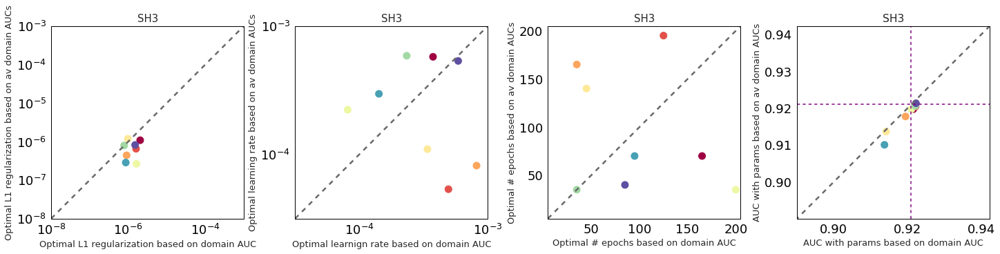

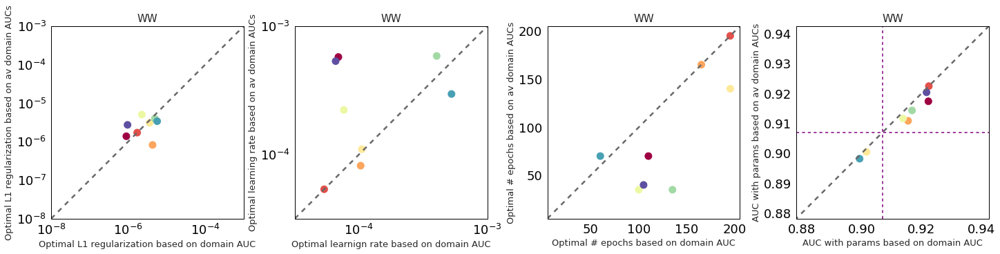

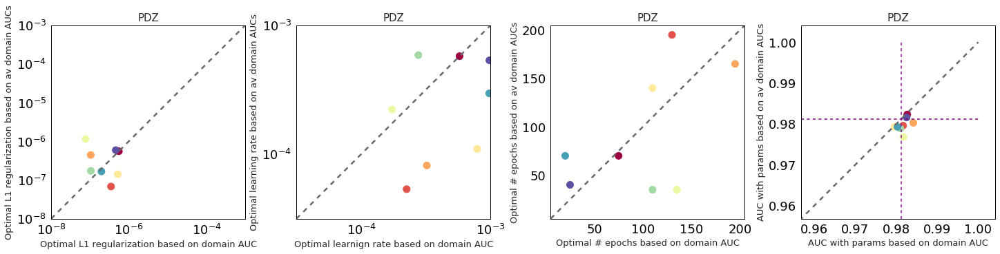

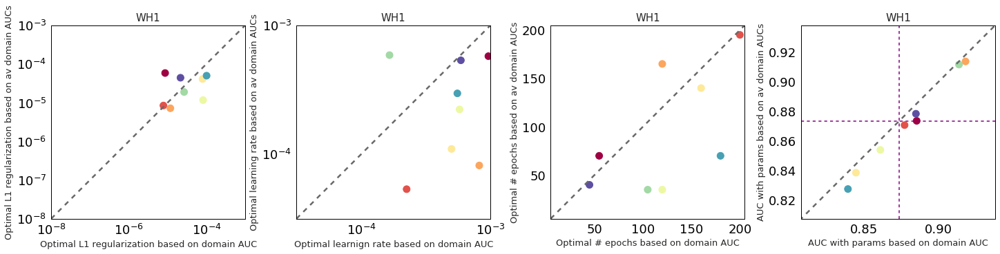

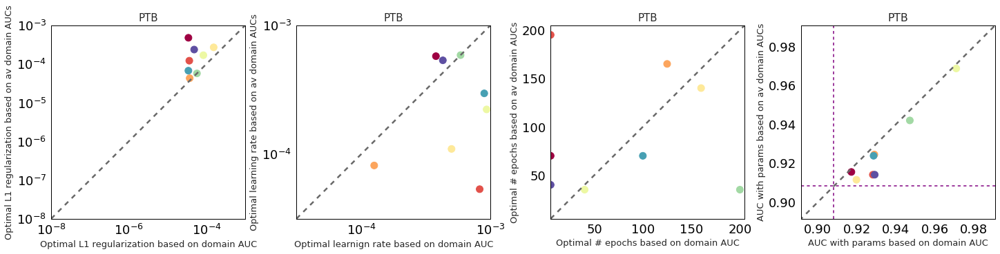

In [13]:
nfolds = 8

grid_results = {dom: [{} for i in range(nfolds)] for dom in domains}
opt_per_fold = []
dom_keys = {}
for i in range(nfolds):
    d, optmean, optmin = get_hsmd_grid_search_results(i, 'hsmd/rand_round2')
    opt_per_fold.append(optmean)
    
    for k in d['auc'][0].keys():
        dom = '_'.join(k.split('_')[:-1])
        dom_keys[dom] = k
        
    lambdas = {dom: [] for dom in domains}
    for ls in d['Lambda Params']:
        for dl in ls.split():
            dom = dl.split(':')[0]
            val = float(dl.split(':')[1])
            lambdas[dom].append(val) 

    for dom in domains:
        for k in d.keys():
            if k == 'Learning Rate' or k == 'Epochs':
                grid_results[dom][i][k] = d[k]
            elif k == 'Lambda Params':
                grid_results[dom][i][k] = lambdas[dom]
            elif k == 'auc':
                grid_results[dom][i]['auc'] = [x[dom_keys[dom]] for x in d[k]]
                

domains = ["SH2", "Kinase_TK", "PTP", "SH3", "WW", "PDZ", "WH1", "PTB"]
# published HSM/D AUC
refs = [0.89, 0, 0.90, 0.92, 0.92, 0.97, 0.88, 0.92]
# new HSM/ID AUC
refsid = [0.878651, 0.977438, 0.891619, 0.920976, 0.907046, 0.981165, 0.873311, 0.908195]
# optimal L1 reg based on HSM/D round 1 grid search, used as reference for round 2
refs_lambda_hsmid = [5.80156e-07, 3.02538e-06, 1.13193e-05, 6.9499e-07, 2.09734e-06, 3.02872e-07, 3.0459e-05, 0.000169522]
for domain, ref, refx, refid in zip(domains, refs, refs_lambda_hsmid, refsid):
    plot_grid_search_results(domain, ref, hyperparamd=grid_results[domain], refx=refx, ref2=refid,
                             lrmin=-4.5, lrmax=-3, flabel='hsmd_round2', nfolds=nfolds, nepochs=200)

lambdas = [{} for i in range(nfolds)]
aucs = [{} for i in range(nfolds)]
for i in range(nfolds):
    for dl in opt_per_fold[i]['Lambda Params'].split():
        dom = dl.split(':')[0]
        val = float(dl.split(':')[1])
        lambdas[i][dom] = val
        for k, v in opt_per_fold[i]['auc'].items():
            dom = '_'.join(k.split('_')[:-1])
            aucs[i][dom] = v
            
for domain, ref, refid in zip(domains, refs, refsid):
    plot_grid_search_results_per_epoch(domain, ref, hyperparamd=grid_results[domain], ref2=refid,
                                       lrmin=-4.5, lrmax=-3, nepochs=200, ntrials=30, flabel='hsmd_round2', nfolds=nfolds)
    
for dom, ref in zip(domains, refsid):
    print('\n%s' % dom)
    plot_opt_hsmd_vs_individual(dom, grid_results, lambdas, aucs, opt_per_fold, ref,
                                lrmin=-4.5, lrmax=-3, nepochs=200, flabel='hsmd_round2', nfolds=nfolds)
    

# Final averaged hyperparameters for HSM/P

First, plot training curve for each fold's optimal hyperparameters split by PBD family.

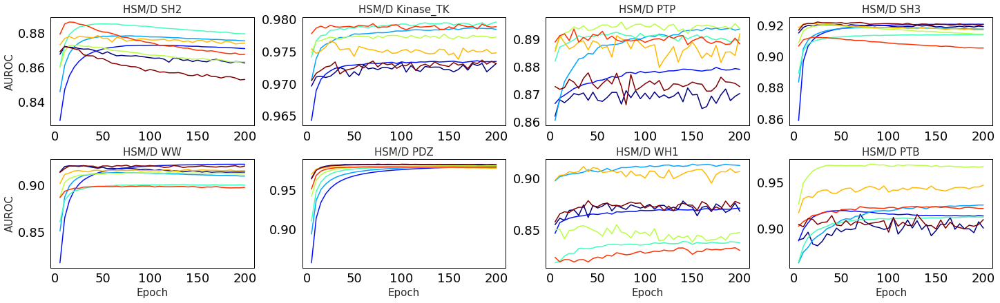

In [14]:
fig, axs = plt.subplots(2, 4, constrained_layout=True, figsize=(20,6))
label = 'HSM/D'

colors = plt.cm.jet(np.linspace(0,1,nfolds))
for fold, (opt, lamb) in enumerate(zip(opt_per_fold, lambdas)):
    ix = int(fold/4)
    iy = fold % 4
    for i, dom in enumerate(domains):
        l1 = lamb[dom]
        results = grid_results[dom][fold]
        ndxs = np.where(np.array(results['Learning Rate']) == opt['Learning Rate'])
        aucs = np.array(results['auc'])[ndxs]
        
        ix = int(i/4)
        iy = i % 4
        im = axs[ix,iy].plot(np.arange(5,205,5), aucs, color=colors[fold])
        
        if ix == 1: axs[ix,iy].set_xlabel("Epoch", fontsize=15)
        if iy == 0: axs[ix,iy].set_ylabel("AUROC", fontsize=15)
        
        axs[ix, iy].set_title('%s %s' % (label, dom), fontsize=15)  

    of = os.path.join(output_directory, 'optimal_hyperparamrun_hsmd_per_epoch.jpg')
    fig.savefig(of, dpi=500, transparent=True, bbox_inches='tight')

A final HSM/D model is trained with optimal HSM/D parameters averaged over all folds, which are determined here.

In [15]:
avs = {'Learning Rate': 0, 'Epochs': 0, 'mean auc': 0}
for opt in opt_per_fold:
    for k in avs.keys():
        avs[k] += float(opt[k])
        #print(k, opt[k])        
    #print('\n')
    
for k in avs.keys():
    print(k, avs[k]/float(nfolds))

lambda_per_domain = {dom: 0 for dom in domains}
for fold, lamb in enumerate(lambdas):
    for dom, v in lamb.items():
        lambda_per_domain[dom] += float(v)

formatted_optl1 = []
for dom, v in lambda_per_domain.items():
    formatted_optl1.append('%s:%g' % (dom, v/float(nfolds)))
    print(dom, v/float(nfolds))
print("Formatted optimal lambda params:")
print(" ".join(formatted_optl1))

Learning Rate 0.000307464351538671
Epochs 93.75
mean auc 0.9178549245818629
SH2 8.355297409156539e-07
Kinase_TK 4.289491049846491e-06
PTP 2.1527776560732886e-05
SH3 6.885124350541833e-07
WW 2.7691999940307603e-06
PDZ 4.1031217209467093e-07
WH1 2.9790922899543867e-05
PTB 0.00017886111609043278
Formatted optimal lambda params:
SH2:8.3553e-07 Kinase_TK:4.28949e-06 PTP:2.15278e-05 SH3:6.88512e-07 WW:2.7692e-06 PDZ:4.10312e-07 WH1:2.97909e-05 PTB:0.000178861
